# Démo - Analyse de la controverse du "LancetGate" sur Twitter

Auteurs : Simon Guillouet et Emilien Schultz

Date de dernière modification : 7/01/2024

## Description du notebook

Ce notebook est une démonstration courte de l'analyse d'un corpus de tweets autour des débats qui ont eu lieu lors de la publication puis de la rétractation d'un article du Lancet en mai 2020 sur l'hydroxychloroquine. Il a été réalisé dans le cadre du stage de recherche de Simon Guillouet.

## Bibliothèques de l'analyse

In [31]:
# Bibliothèques de base
import pandas as pd
from collections import Counter
from statistics import mean 
from datetime import datetime
import numpy as np
from pathlib import Path

# Bibliothèques statistiques & d'analyse de réseau
import pyshs
import networkx as nx
from ipysigma import Sigma
import networkx.algorithms.community as nx_comm

# Bibliothèques pour la construction de graphique
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter
from matplotlib.lines import Line2D
import matplotlib.dates as mdates
import seaborn as sns

# Extraction des racines URLs
from urllib.parse import urlparse

import warnings
warnings.filterwarnings("ignore")

## 1. Le Corpus de Tweet

Le corpus de tweets utilisé pour cette analyse a été récupéré via l'API Twitter courant juin 2020, avec les outils du médialab (tweets mentionnant certains mots clés + les threads antérieurs). Il compte environ 1 500 000 tweets dans toutes les langues postés entre 2015 et juillet 2020.

In [34]:
path_data_brut = Path("../data/bd_tweet_total.csv")
data_complet = pd.read_csv(path_data_brut, encoding='utf-8')
data_complet['created_at'] = pd.to_datetime(data_complet['created_at'], errors='coerce')

In [35]:
data_complet.head()

,id,time,created_at,from_user_name,text,filter_level,possibly_sensitive,withheld_copyright,withheld_scope,withheld_countries,...,retweeted_user_id,quoted_id,quoted_user_name,quoted_user_id,links,medias_urls,medias_files,mentioned_user_names,mentioned_user_ids,hashtags
0,563372782277230592,1.423154e+09,2015-02-05 16:25:12,CDCDirector,Read about the impact of the introduction of #...,NaN,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,https://www.thelancet.com/journals/laninf/arti...,NaN,NaN,thelancet,27013292,pcv13
1,568099603456720896,1.424280e+09,2015-02-18 17:27:54,blk_bk,I don't think I ask unreasonable questions. B...,NaN,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,https://pbs.twimg.com/media/B-JLlC7CcAAuGz_.png,568099603456720896_B-JLlC7CcAAuGz_.png,NaN,NaN,NaN
2,607723868632039424,1.433728e+09,2015-06-08 01:40:35,srtasexiEc,No se si me ha picado una avispa o el gym me e...,NaN,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,https://pbs.twimg.com/media/CG8RoxHXAAAirI_.jpg,607723868632039424_CG8RoxHXAAAirI_.jpg,NaN,NaN,NaN
3,655616821752520704,1.445146e+09,2015-10-18 05:30:05,theage,#Paleo chef Pete Evans wins @AustSkeptics #Ben...,NaN,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,https://www.theage.com.au/entertainment/pete-e...,https://pbs.twimg.com/media/CRklrchUwAAx-Ih.jpg,655616821752520704_CRklrchUwAAx-Ih.jpg,austskeptics,21545598,bentspoon|paleo
4,663015614290591744,1.446910e+09,2015-11-07 15:30:15,tagadala7,Vi ricordiamo i nostri contatti. Scriveteci nu...,NaN,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,https://pbs.twimg.com/media/CTN-muuWsAATmsG.png,663015614290591744_CTN-muuWsAATmsG.png,NaN,NaN,tagadala7


**Langues**

Le Français, deuxième langue la plus utilisée pendant la controverse.

In [36]:
pd.DataFrame(Counter(data_complet["lang"]).most_common(10), columns=['Langue', 'Nombre de tweets'])

,Langue,Nombre de tweets
0,en,639009
1,fr,535221
2,pt,142537
3,es,73675
4,und,43770
5,ja,29096
6,nl,14123
7,it,12509
8,tr,7740
9,ar,5844


Des tweets postés entre 2015 et 2020

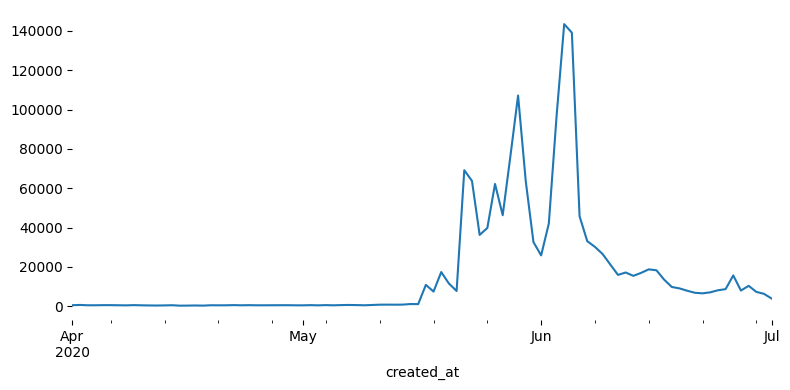

In [37]:
fig, ax = plt.subplots(1,1,figsize=(8, 4))
data_complet.set_index("created_at").resample("d")["id"].count().plot(ax=ax)
ax.set_frame_on(False)
plt.xlim("2020-04-01","2020-07-01")
plt.tight_layout()

### Réduire le corpus

- Francophone
- Sur la période des événements

In [38]:
# Tweets en FRANCAIS uniquement
data = data_complet[(data_complet.lang == "fr")]

# Conservation des données entre le 20 mai et le 11 juin 2020
data['date'] = pd.to_datetime(data['created_at']).dt.date
mask = (data['date'] >= pd.to_datetime('2020-05-20').date() ) & (data['date'] <= pd.to_datetime('2020-06-11').date() )
data = data.loc[mask]

# On procède à plusieurs modification pour simplifier l'analyse
data['nb_1'] = 1 
data['RT'] = data['retweeted_user_name'].notnull()
data['RT_nb'] = 0
data.loc[data['retweeted_user_name'].notnull(), 'RT_nb'] = 1

data['REP_nb'] = 0
data.loc[data['to_user_name'].notnull(), 'REP_nb'] = 1

data['Q_nb'] = 0
data.loc[data['quoted_user_name'].notnull(), 'Q_nb'] = 1

# suppression du dataset brut pour la mémoire
del data_complet

# Reset de l'index
data = data.reset_index(drop=True)

## 2. La controverse dans le temps

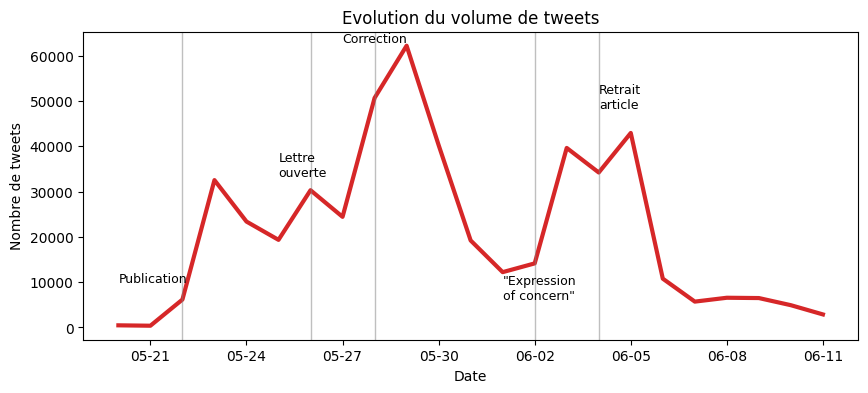

In [39]:
# Graphique sur l'évolution du nombre de Tweets pendant la controverse
fig, ax = plt.subplots(figsize=(10,4))
ax.plot(data['date'].value_counts().sort_index(), linewidth=3, color='C3')

plt.axvline(datetime(2020, 5, 22), linewidth=1, color='grey', alpha=0.5)
plt.axvline(datetime(2020, 5, 26), linewidth=1, color='grey', alpha=0.5)
plt.axvline(datetime(2020, 5, 28), linewidth=1, color='grey', alpha=0.5)
plt.axvline(datetime(2020, 6, 2), linewidth=1, color='grey', alpha=0.5)
plt.axvline(datetime(2020, 6, 4), linewidth=1, color='grey', alpha=0.5)

ax.annotate('Publication', xy=(datetime(2020, 5, 20), 10000), fontsize=9)
ax.annotate('Lettre\nouverte\n', xy=(datetime(2020, 5, 25), 30000), fontsize=9)
ax.annotate('Correction', xy=(datetime(2020, 5, 27), 63000), fontsize=9)
ax.annotate('"Expression\nof concern"\n', xy=(datetime(2020, 6, 1),3000), fontsize=9)
ax.annotate('Retrait\narticle\n', xy=(datetime(2020, 6, 4), 45000), fontsize=9)

half_year_locator = mdates.DayLocator(interval=3) #Interval de dates
ax.xaxis.set_major_locator(half_year_locator) #Interval de dates

dfmt = DateFormatter("%m-%d") # Formatage de la date
ax.xaxis.set_major_formatter(dfmt) # Formatage de la date

ax.set_xlabel("Date")
ax.set_ylabel("Nombre de tweets") 
plt.title("Evolution du volume de tweets", loc='Center', fontsize=12, fontweight=0, color='black');

Il est intéressant de constater que le pic du nombre de tweet n'est pas atteint au moment du retrait  de l'article mais avant, quand la controverse est en cours et que l'incertitude demeure sur la véracité des conclusions de l'article. La suspicion, le doute et le processus de production des discours semblent plus générateur de tweets que le fait que la question soit tranchée malgrès les problèmes de fond qu'elle soulève.

## 3. Un débat viral

Regarder la viralité des tweets (rapport tweets/retweets)

In [40]:
# Proportion de Retweets
"Les {} retweets représentent {}% de l'ensemble du corpus".format(data["RT_nb"].sum(),
                                                         round( ( (data["RT"]).sum() / len(data))*100,1) )          

"Les 350819 retweets représentent 71.6% de l'ensemble du corpus"

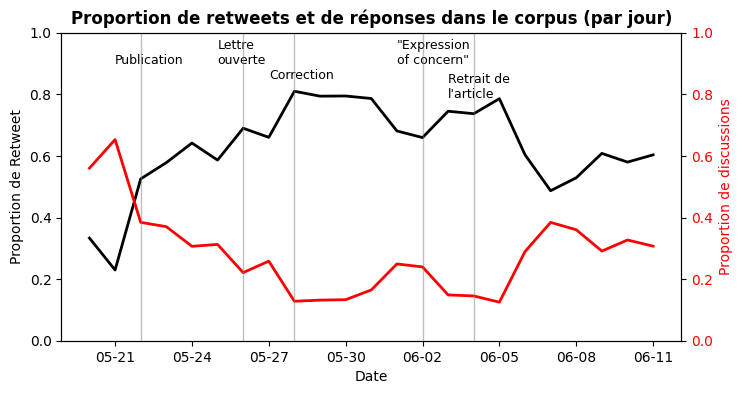

In [41]:
# Evolution de la part des RT dans les tweets globaux:
fig, ax1 = plt.subplots(figsize=(8,4))

ax2 = ax1.twinx()
ax1.set_ylim(0, 1)  
ax2.set_ylim(0, 1)

ax1.plot(data[data.RT==True]['date'].value_counts().sort_index() / data['date'].value_counts().sort_index(), color="black",linewidth=2)
ax2.plot(data[data.REP_nb==1]['date'].value_counts().sort_index() / data['date'].value_counts().sort_index(), color="red",linewidth=2)

plt.axvline(datetime(2020, 5, 22), linewidth=1, color='grey', alpha=0.5)
plt.axvline(datetime(2020, 5, 26), linewidth=1, color='grey', alpha=0.5)
plt.axvline(datetime(2020, 5, 28), linewidth=1, color='grey', alpha=0.5)
plt.axvline(datetime(2020, 6, 2), linewidth=1, color='grey', alpha=0.5)
plt.axvline(datetime(2020, 6, 4), linewidth=1, color='grey', alpha=0.5)

ax1.annotate('Publication', xy=(datetime(2020, 5, 21), 0.9), fontsize=9)
ax1.annotate('Lettre\nouverte\n', xy=(datetime(2020, 5, 25), 0.85), fontsize=9)
ax1.annotate('Correction', xy=(datetime(2020, 5, 27), 0.85), fontsize=9)
ax1.annotate('"Expression\nof concern"\n', xy=(datetime(2020, 6, 1),0.85), fontsize=9)
ax1.annotate("Retrait de\nl'article\n", xy=(datetime(2020, 6, 3), 0.74), fontsize=9)

half_year_locator = mdates.DayLocator(interval=3) #Interval de dates
ax1.xaxis.set_major_locator(half_year_locator) #Interval de dates

dfmt = DateFormatter("%m-%d") # Formatage de la date: sans l'année
ax1.xaxis.set_major_formatter(dfmt) # Formatage de la date: sans l'année

ax1.set_ylabel("Proportion de Retweet", color= "black")
ax1.tick_params(axis="y", labelcolor="black")
ax2.set_ylabel("Proportion de discussions", color = "red")
ax2.tick_params(axis="y", labelcolor="red")

ax1.set_xlabel("Date")
plt.title("Proportion de retweets et de réponses dans le corpus (par jour)", loc='Center', fontsize=12,fontweight="bold", color='black');

**Un débat dominé par un groupe restreint**

In [42]:
data["retweeted_user_name"].value_counts().head()

retweeted_user_name
raoult_didier      43097
medicalfollower    14128
biobiobiobior       8791
aragon_jb           7916
ArianeWalter        6507
Name: count, dtype: int64

On constate rapidemment que les retweets sont massivement le fait d'un petit nombre de comptes TRES influent: 348 comptes ont plus de 100 RT cumulés et 71 en ont plus de 1000. Ces personnes sont les principaux "passeurs" du débat dans le contexte Français:
- Les 10 comptes les plus RT comptent pour 20% de tous les tweets (101k)
- Les 30 comptes les plus RT comptent pour 27% de tous les tweets (132k)
- Les 100 comptes les plus RT comptent pour 50% de tous les tweets (236k)

In [12]:
# Nombre total de compte RT
"Il y a {} retweets de {} tweets originaux fait par {} comptes".format(data["RT_nb"].sum(),
                                        data[data.RT == True].groupby('text')['RT_nb'].sum().count(),
                                        len(data.groupby('retweeted_user_name')['nb_1'].sum()))

'Il y a 350819 retweets de 21042 tweets originaux fait par 6943 comptes'

### L'importance de Didier Raoult

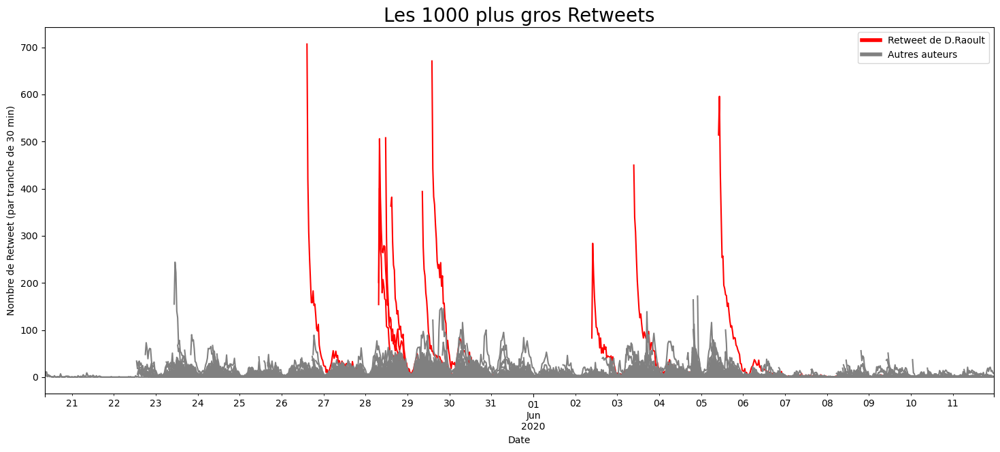

In [231]:
topretweets = data.groupby('text').size().sort_values(ascending=False).reset_index()

plt.figure(figsize=(18,7))
for top in range(0,1000):
    tweetid = topretweets.iloc[top].text
    Auteur = data[data.text == tweetid]["retweeted_user_name"].unique()[0]
    if Auteur == 'raoult_didier':
        Couleur_x = "red"
    else: 
        Couleur_x = "grey"
    
    top_retweets = data[data.text==tweetid]
    top_retweets.groupby(\
                                       pd.Grouper(key='created_at', freq='30min')).size().plot(color=Couleur_x)

# Légende
legend_elements = [Line2D([0], [0], color='red', lw=4, label='Retweet de D.Raoult'),
                       Line2D([0], [0], color='grey', lw=4, label='Autres auteurs')]
plt.legend(handles=legend_elements, loc='upper right')

plt.xlabel('Date')
plt.ylabel('Nombre de Retweet (par tranche de 30 min)')
plt.title('Les 1000 plus gros Retweets', fontsize = 20)
plt.show();

## 4. Analyse relationnelle

Un retweet est un tweet repris par quelqu'un : cela crée une relation entre deux comptes.

Que se passe-t-il si on regarde ça sur l'ensemble des comptes ?

Création du réseau de retweet comme réseau de validation

In [43]:
network_retweets = nx.Graph()

# On fait une boucle pour chaque tweet du corpus
for i, line in data.iterrows():
    
    # Nom du compe ayant tweeté
    utilisateur = str(line["from_user_name"])
    
    # L'utilisateur est-il déjà dans le réseau ?
    if not utilisateur in network_retweets.nodes:
        # S'il n'y est pas, on l'ajoute avec un poids de 1
        network_retweets.add_node(utilisateur, label=utilisateur, weight=1)
    else:
        # S'il l'est, on augmente son poids de 1
        network_retweets.nodes[utilisateur]["weight"] += 1    

    # Si le tweet est un retweet
    if pd.notnull(line["retweeted_user_name"]):

        # on extrait le nom de l'auteur original du tweet 
        retweet_utilisateur = str(line["retweeted_user_name"])
        
        # si cet auteur original n'est pas dans le réseau
        if not retweet_utilisateur in network_retweets.nodes:
            # on ajoute un noeud
            network_retweets.add_node(retweet_utilisateur, label=retweet_utilisateur, weight=0)

        # s'il y a un retweet
        if pd.notnull(retweet_utilisateur):
            
            # si l'arrête entre l'utilisitateur et l'auteur original du tweet n'existe pas
            if not network_retweets.has_edge(utilisateur, retweet_utilisateur):
                # On créé cette arrête
                network_retweets.add_edge(utilisateur, retweet_utilisateur, weight=1)
            else:
                # si elle existe déjà on on augmente son poids de 1
                network_retweets[utilisateur][retweet_utilisateur]["weight"] += 1 

In [17]:
print(network_retweets)

Graph with 69336 nodes and 250792 edges


tous les éléments ne sont pas forcément connectés

Avant toute analyse, on constate qu'il existe d'un côté un groupe relativement important d'isolats (comptes n'ayant pas fait un seul RT et sans connexion) et un ensemble de nombreux petits graphs de quelques dizaines de noeuds qui sont déconnectés du reste. Le reste forme un grand groupe de plus de 55 000 personnes qui constituent 80% de tous les comptes. Ce groupe est le centre de l'activité Twitter concernant la controverse du Lancet. Il est aussi possible que les isolats et groupes déconnectés soient simplement la conséquence de l'existence d'autres conversions sur le "lancet" parralélement au débat central.

In [11]:
print("Le graph a",nx.number_of_isolates(network_retweets), "isolats")

Le graph a 12889 isolats


In [94]:
# Nombre de sous réseaux
list_subgraph = list(nx.connected_components(network_retweets))
list_subgraph.sort(key=len, reverse=True)
print("Nombre de sous réseaux isolés:", (len(list_subgraph) - nx.number_of_isolates(network_retweets)))  # 411 sous graphs (hormis les isolats)

Nombre de sous réseaux isolés: 411


In [12]:
 # Le sous réseau le plus gros
print("Le sous réseau le plus gros a", len(list_subgraph[0]), "noeuds")

Le sous réseau le plus gros a 55391 noeuds


In [ ]:
# Création du sous-graphe de la composante principale (sur laquelle on se concentre)
list_subgraph = list(nx.connected_components(network_retweets))
list_subgraph.sort(key=len, reverse=True)
connected_graph = network_retweets.subgraph(list_subgraph[0])

C'est un gros réseau. Est-ce qu'on peut le représenter, par exemple tous les comptes qui ont retweetés Didier Raoult ?

In [23]:
ego_graph = nx.ego_graph(connected_graph, "raoult_didier")

In [25]:
Sigma(ego_graph,node_size="weight")

Sigma(nx.Graph with 18,807 nodes and 95,011 edges)

### Clusters


In [27]:
# On génénère la clusterisation avec l'algorithme de Louvain
cluster_multiples = nx_comm.louvain_communities(connected_graph, weight='weight', 
                                                resolution=1, threshold=1e-07, seed=123)
# Trier du plus grand au plus petit
cluster_multiples = sorted(cluster_multiples,key=len,reverse=True)

# Liste des clusters
liste_clusters = pd.Series([len(i) for i in sorted(cluster_multiples)])

# Nombre de clusters
print("il y a au total",len(liste_clusters), "clusters dans cette partion")

# Regroupement des clusters après le rang 7
cluster8 = set()
for i in cluster_multiples[8:]:
    cluster8.update(i)

# Liste des clusters
cluster_7 =  cluster_multiples[0:7] + [cluster8]

il y a au total 58 clusters dans cette partion


Créer un attribut avec le numéro du cluster

In [28]:
all_nodes = list(connected_graph.nodes)
clusters = {}
for i,j in enumerate(cluster_multiples[0:6]):
    for k in j:
        clusters[k] = i
for i in all_nodes:
    if not i in clusters:
        clusters[i] = 7
        
nx.set_node_attributes(connected_graph,clusters,name="cluster")

**Visualisation du réseau**

In [29]:
degrees = dict(connected_graph.degree())

# Filtrer les nœuds avec un degré supérieur à 1
filtered_nodes = [node for node, degree in degrees.items() if degree > 10]

# Créer un sous-graphe avec les nœuds filtrés
filtered_graph = connected_graph.subgraph(filtered_nodes)

In [30]:
print(filtered_graph)
print(connected_graph)

Graph with 6402 nodes and 147157 edges
Graph with 55391 nodes and 250081 edges


In [59]:
# Visualisation interractive
Sigma(filtered_graph,
      node_color=dict(filtered_graph.nodes(data="cluster")) , 
      node_size = filtered_graph.degree, 
      node_size_range=(1.5,20),
      default_edge_color = "white",
      default_node_label_color = "black",
      node_zindex = filtered_graph.degree,
      default_node_label_size = 16)

Sigma(nx.Graph with 6,402 nodes and 147,157 edges)

***Rendu statique pour le notebook - utiliser ipysigma pour le rendu interactif***

<div>
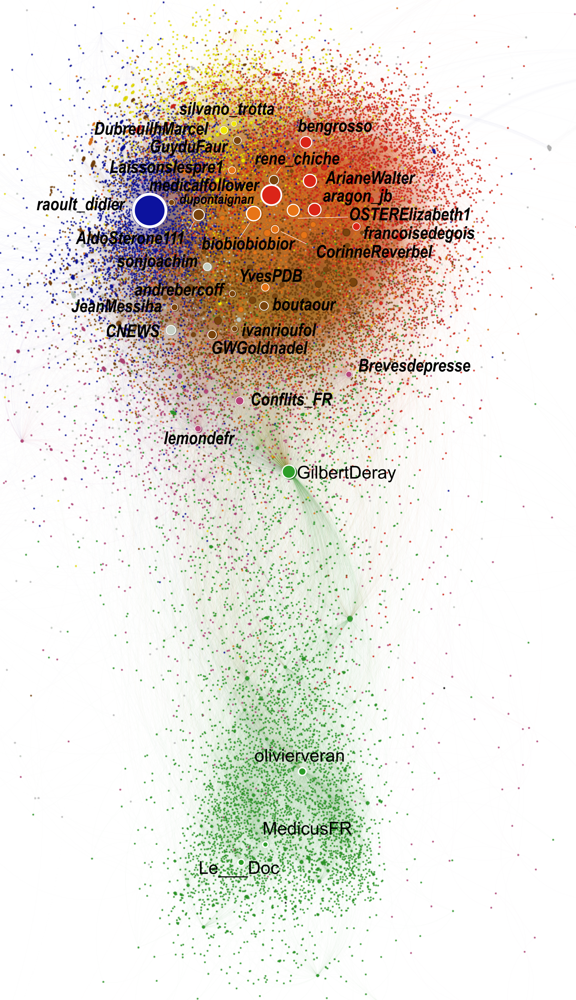
</div>
